# Red Wine Quality Prediction Project

Project Description

The dataset is related to red and white variants of the Portuguese "Vinho Verde" wine. Due to privacy and logistic issues, only 
physicochemical (inputs) and sensory (the output) variables are available (e.g. there is no data about grape types, wine brand, wine 
selling price, etc.).

This dataset can be viewed as classification task. The classes are ordered and not balanced (e.g. there are many more normal wines than 
excellent or poor ones). Also, we are not sure if all input variables are relevant. So it could be interesting to test feature selection 
methods.

Attribute Information

Input variables (based on physicochemical tests):

1 - fixed acidity

2 - volatile acidity

3 - citric acid

4 - residual sugar

5 - chlorides

6 - free sulfur dioxide

7 - total sulfur dioxide

8 - density

9 - pH

10 - sulphates

11 - alcohol

Output variable (based on sensory data):

12 - quality (score between 0 and 10)

What might be an interesting thing to do, is to set an arbitrary cutoff for your dependent variable (wine quality) at e.g. 7 or higher
getting classified as 'good/1' and the remainder as 'not good/0'.

This allows you to practice with hyper parameter tuning on e.g. decision tree algorithms looking at the ROC curve and the AUC value.
You need to build a classification model. 


In [2]:
# import necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [3]:
# Reading the dataset
df = pd.read_csv('https://raw.githubusercontent.com/FlipRoboTechnologies/ML-Datasets/main/Red%20Wine/winequality-red.csv')
df.head(5)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [4]:
df.shape

(1599, 12)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [6]:
# Check if any nulls
df.isna().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [7]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [8]:
df.columns.tolist()

['fixed acidity',
 'volatile acidity',
 'citric acid',
 'residual sugar',
 'chlorides',
 'free sulfur dioxide',
 'total sulfur dioxide',
 'density',
 'pH',
 'sulphates',
 'alcohol',
 'quality']

In [9]:
# Check the datatypes of each column
df.dtypes

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
dtype: object

As we can see there are only numerical columns

In [10]:
df['fixed acidity'].unique()

array([ 7.4,  7.8, 11.2,  7.9,  7.3,  7.5,  6.7,  5.6,  8.9,  8.5,  8.1,
        7.6,  6.9,  6.3,  7.1,  8.3,  5.2,  5.7,  8.8,  6.8,  4.6,  7.7,
        8.7,  6.4,  6.6,  8.6, 10.2,  7. ,  7.2,  9.3,  8. ,  9.7,  6.2,
        5. ,  4.7,  8.4, 10.1,  9.4,  9. ,  8.2,  6.1,  5.8,  9.2, 11.5,
        5.4,  9.6, 12.8, 11. , 11.6, 12. , 15. , 10.8, 11.1, 10. , 12.5,
       11.8, 10.9, 10.3, 11.4,  9.9, 10.4, 13.3, 10.6,  9.8, 13.4, 10.7,
       11.9, 12.4, 12.2, 13.8,  9.1, 13.5, 10.5, 12.6, 14. , 13.7,  9.5,
       12.7, 12.3, 15.6,  5.3, 11.3, 13. ,  6.5, 12.9, 14.3, 15.5, 11.7,
       13.2, 15.9, 12.1,  5.1,  4.9,  5.9,  6. ,  5.5])

In [11]:
df['fixed acidity'].nunique()

96

In [12]:
# Checking the value counts of each columns
for i in df.columns:
    print(df[i].value_counts())
    print("\n")

fixed acidity
7.2     67
7.1     57
7.8     53
7.5     52
7.0     50
        ..
13.5     1
13.8     1
13.4     1
4.7      1
5.5      1
Name: count, Length: 96, dtype: int64


volatile acidity
0.600    47
0.500    46
0.430    43
0.590    39
0.360    38
         ..
1.035     1
0.565     1
1.130     1
1.115     1
1.090     1
Name: count, Length: 143, dtype: int64


citric acid
0.00    132
0.49     68
0.24     51
0.02     50
0.26     38
       ... 
0.72      1
0.62      1
0.75      1
1.00      1
0.78      1
Name: count, Length: 80, dtype: int64


residual sugar
2.00     156
2.20     131
1.80     129
2.10     128
1.90     117
        ... 
4.25       1
2.85       1
3.45       1
2.35       1
13.90      1
Name: count, Length: 91, dtype: int64


chlorides
0.080    66
0.074    55
0.076    51
0.078    51
0.084    49
         ..
0.108     1
0.148     1
0.143     1
0.222     1
0.230     1
Name: count, Length: 153, dtype: int64


free sulfur dioxide
6.0     138
5.0     104
10.0     79
15.0     78
12

In [13]:
# Drop all duplicates
df.drop_duplicates(inplace = True)

In [14]:
df.shape

(1359, 12)

Out of 1599 rows only 1359 rows are left after removing the duplicates

As per the observation there are only numerical columns not categorical columns. Let's confirm again!

In [15]:
# Seperating Numerical and categorical columns

# Checking for categorical columns
categorical_col = []
for i in df.dtypes.index:
    if df.dtypes[i] == 'object':
        categorical_col.append(i)
print('Categorical columns: ',categorical_col)
print('\n')

# Checking for numerical columns
numerical_col = []
for i in df.dtypes.index:
    if df.dtypes[i] != 'object':
        numerical_col.append(i)
print('Numerical columns: ',numerical_col)

Categorical columns:  []


Numerical columns:  ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol', 'quality']


In [16]:
# Checking number of unique values in each column
df.nunique().to_frame("Number of unique values")

,Number of unique values
fixed acidity,96
volatile acidity,143
citric acid,80
residual sugar,91
chlorides,153
free sulfur dioxide,60
total sulfur dioxide,144
density,436
pH,89
sulphates,96


In [17]:
df.reset_index()

,index,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1354,1593,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6
1355,1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1356,1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1357,1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [18]:
# Check the unique values of target column 'quality'
df['quality'].unique()

array([5, 6, 7, 4, 8, 3], dtype=int64)

In [19]:
df['quality'].value_counts()

quality
5    577
6    535
7    167
4     53
8     17
3     10
Name: count, dtype: int64

We can assume that "8" stands for great alcohol quality and "3" stands for worst quality. 

In [20]:
# Check for description
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000
mean,8.310596,0.529478,0.272333,2.523400,0.088124,15.893304,46.825975,0.996709,3.309787,0.658705,10.432315,5.623252
std,1.736990,0.183031,0.195537,1.352314,0.049377,10.447270,33.408946,0.001869,0.155036,0.170667,1.082065,0.823578
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996700,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.430000,2.600000,0.091000,21.000000,63.000000,0.997820,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


# Check for normal distribution

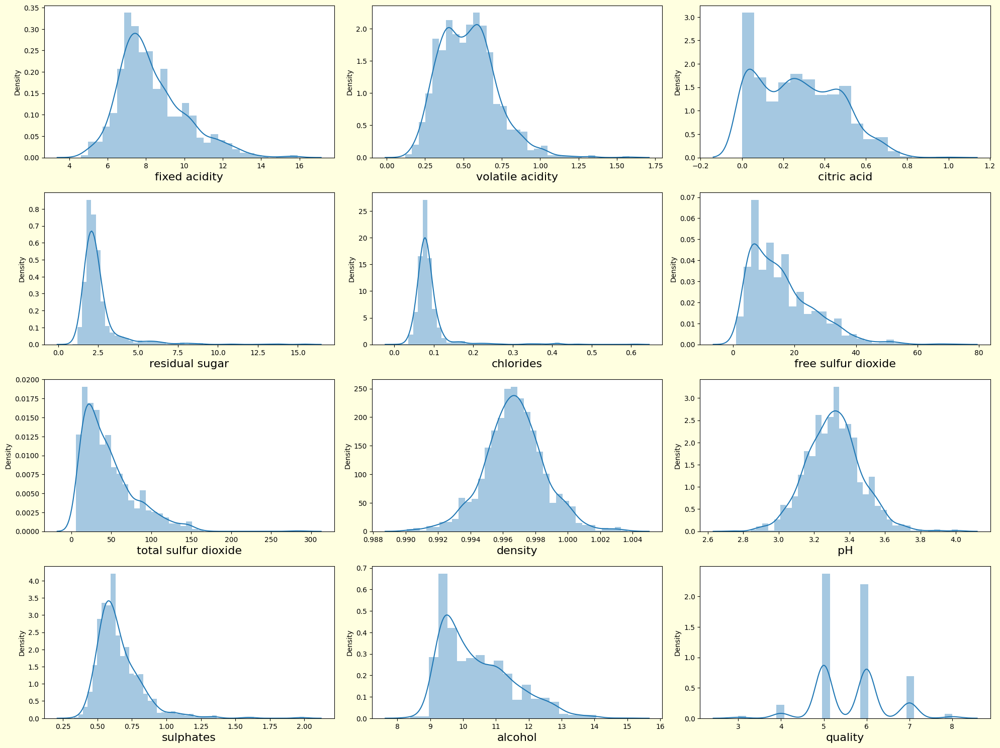

In [21]:
plt.figure(figsize = (20,15),facecolor = 'lightyellow')
plotnumber = 1

for column in df.columns:
    if plotnumber <= len(numerical_col):
        ax = plt.subplot(4,3,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column,fontsize = 16)
    plotnumber += 1
plt.tight_layout()

Treating outliers(if any)

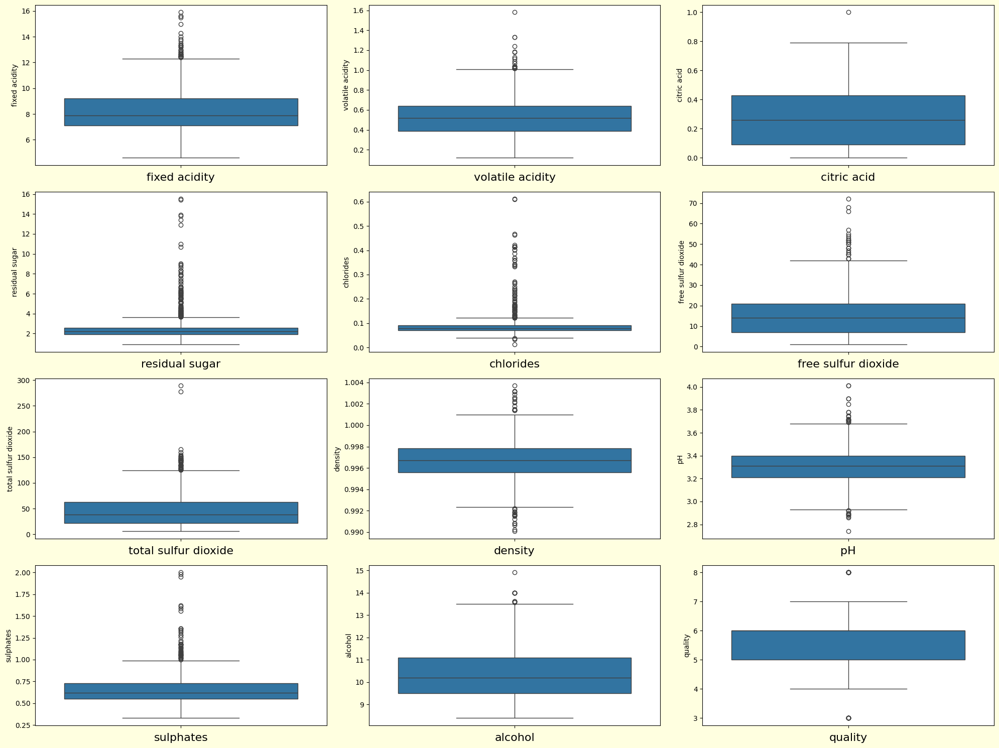

In [22]:
plt.figure(figsize = (20,15),facecolor = 'lightyellow')
plotnumber = 1

for column in df.columns:
    if plotnumber <= len(numerical_col):
        ax = plt.subplot(4,3,plotnumber)
        sns.boxplot(df[column])
        plt.xlabel(column,fontsize = 16)
    plotnumber += 1
plt.tight_layout()

In [23]:
df.skew()

fixed acidity           0.941041
volatile acidity        0.729279
citric acid             0.312726
residual sugar          4.548153
chlorides               5.502487
free sulfur dioxide     1.226579
total sulfur dioxide    1.540368
density                 0.044778
pH                      0.232032
sulphates               2.406505
alcohol                 0.859841
quality                 0.192407
dtype: float64

Here we need to treat outliers.Before that let's visualize the data

# Data Visualization

Univariate Analysis

quality
5    577
6    535
7    167
4     53
8     17
3     10
Name: count, dtype: int64


<Axes: xlabel='quality', ylabel='count'>

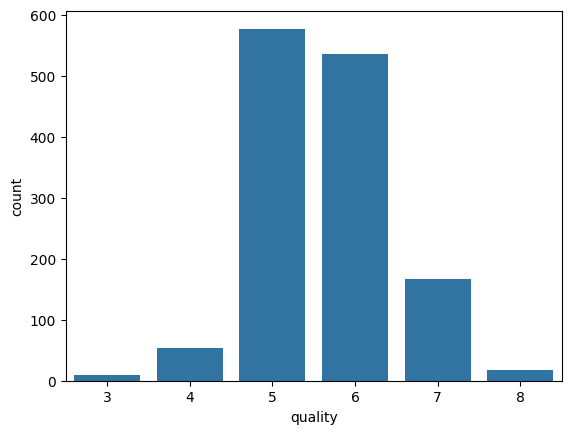

In [24]:
print(df['quality'].value_counts())
sns.countplot(x = 'quality',data = df)

In [25]:
df.columns.to_list()

['fixed acidity',
 'volatile acidity',
 'citric acid',
 'residual sugar',
 'chlorides',
 'free sulfur dioxide',
 'total sulfur dioxide',
 'density',
 'pH',
 'sulphates',
 'alcohol',
 'quality']

alcohol
9.500000     111
9.400000      91
9.200000      65
9.800000      63
10.000000     61
            ... 
8.500000       1
10.033333      1
13.500000      1
13.200000      1
10.750000      1
Name: count, Length: 65, dtype: int64


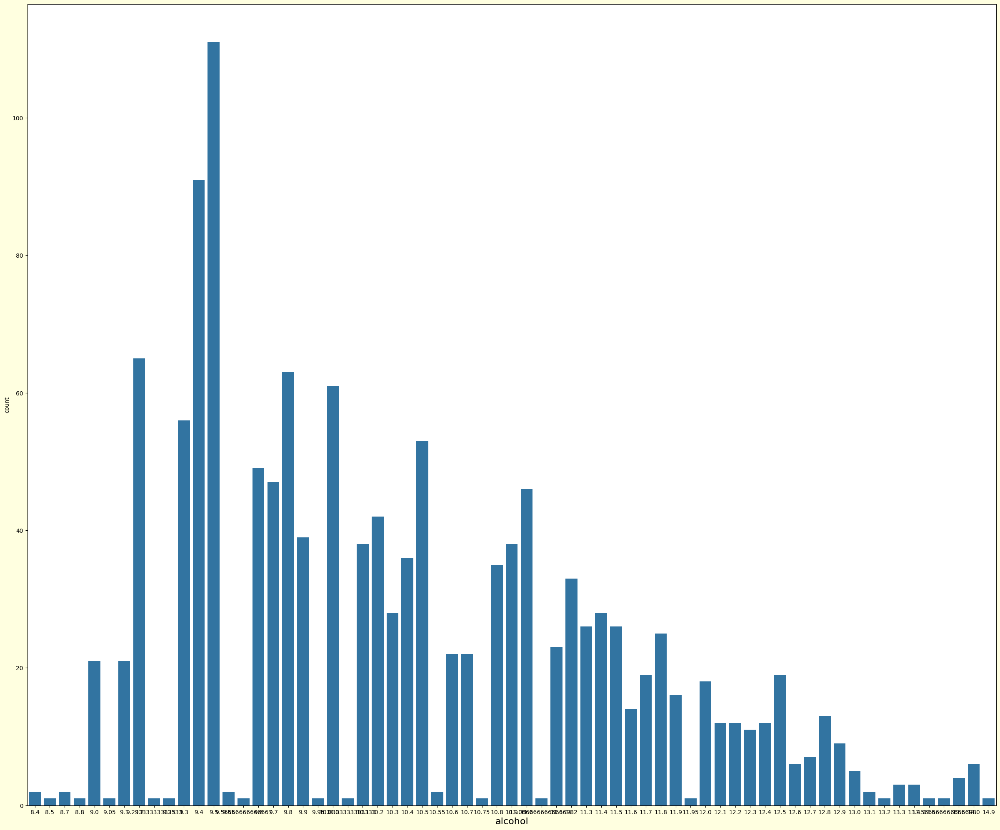

In [26]:
print(df['alcohol'].value_counts())
plt.figure(figsize = (30,25),facecolor = 'lightyellow')
sns.countplot(x = 'alcohol',data = df)
plt.xlabel('alcohol',fontsize = 16)
plt.show()

sulphates
0.54    58
0.58    57
0.60    57
0.62    53
0.56    52
        ..
1.59     1
1.26     1
0.33     1
1.09     1
1.01     1
Name: count, Length: 96, dtype: int64


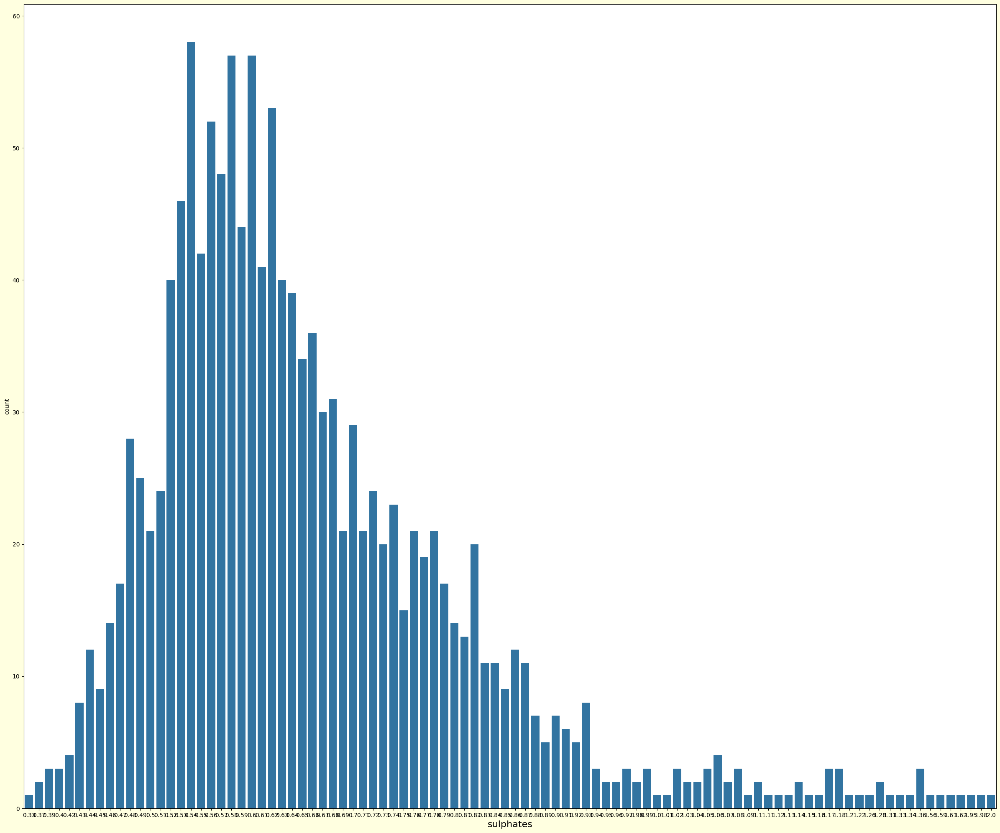

In [27]:
print(df['sulphates'].value_counts())
plt.figure(figsize = (30,25),facecolor = 'lightyellow')
sns.countplot(x = 'sulphates',data = df)
plt.xlabel('sulphates',fontsize = 16)
plt.show()

pH
3.30    47
3.26    45
3.36    42
3.38    41
3.32    40
        ..
3.75     1
3.85     1
2.74     1
3.70     1
2.90     1
Name: count, Length: 89, dtype: int64


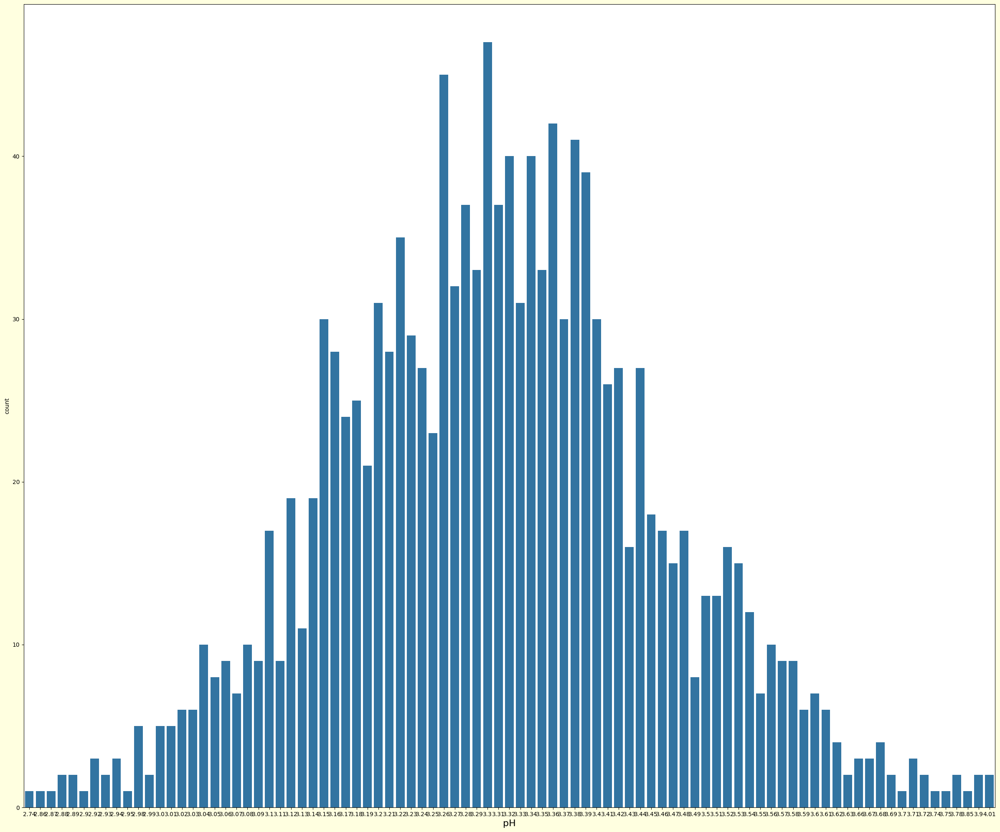

In [28]:
print(df['pH'].value_counts())
plt.figure(figsize = (30,25),facecolor = 'lightyellow')
sns.countplot(x = 'pH',data = df)
plt.xlabel('pH',fontsize = 16)
plt.show()

density
0.99680    33
0.99760    30
0.99720    29
0.99800    28
0.99620    23
           ..
0.99756     1
0.99859     1
0.99426     1
0.99747     1
0.99651     1
Name: count, Length: 436, dtype: int64


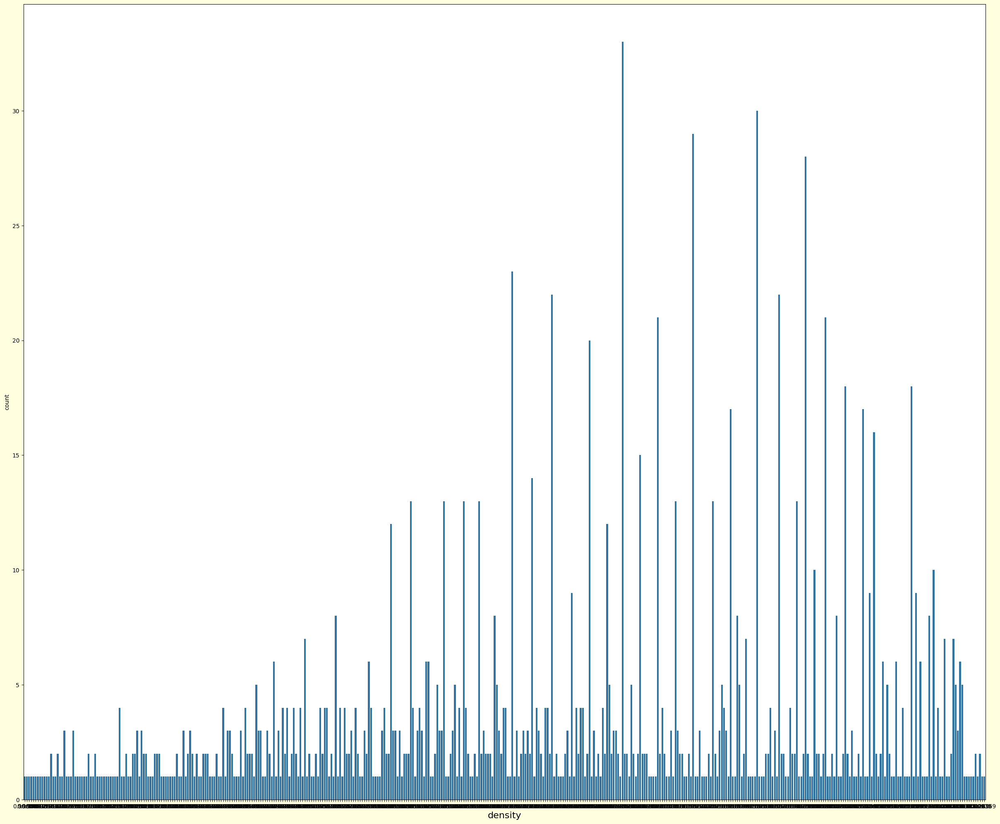

In [29]:
print(df['density'].value_counts())
plt.figure(figsize = (30,25),facecolor = 'lightyellow')
sns.countplot(x = 'density',data = df)
plt.xlabel('density',fontsize = 16)
plt.show()

total sulfur dioxide
28.0     35
24.0     32
14.0     30
20.0     29
18.0     28
         ..
116.0     1
165.0     1
128.0     1
126.0     1
131.0     1
Name: count, Length: 144, dtype: int64


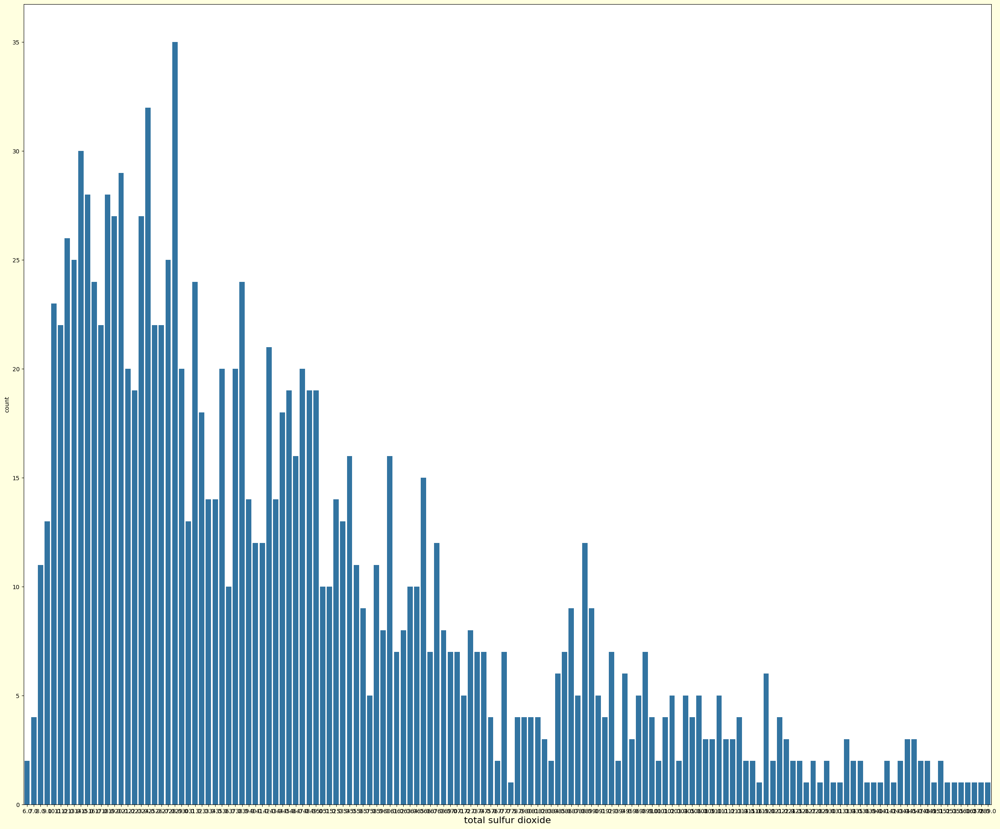

In [30]:
print(df['total sulfur dioxide'].value_counts())
plt.figure(figsize = (30,25),facecolor = 'lightyellow')
sns.countplot(x = 'total sulfur dioxide',data = df)
plt.xlabel('total sulfur dioxide',fontsize = 16)
plt.show()

free sulfur dioxide
6.0     121
5.0      88
15.0     65
12.0     64
10.0     63
7.0      61
9.0      55
16.0     53
17.0     50
11.0     49
13.0     48
8.0      47
14.0     41
3.0      41
18.0     40
21.0     36
4.0      34
19.0     34
26.0     29
23.0     28
24.0     27
20.0     26
27.0     24
25.0     21
28.0     20
22.0     19
29.0     19
32.0     19
34.0     17
35.0     14
31.0     14
30.0     13
33.0     10
36.0      9
38.0      7
41.0      5
40.0      5
39.0      4
37.0      3
42.0      3
48.0      3
52.0      3
51.0      3
45.0      3
43.0      3
37.5      2
1.0       2
50.0      2
47.0      1
54.0      1
46.0      1
68.0      1
2.0       1
5.5       1
53.0      1
40.5      1
57.0      1
72.0      1
55.0      1
66.0      1
Name: count, dtype: int64


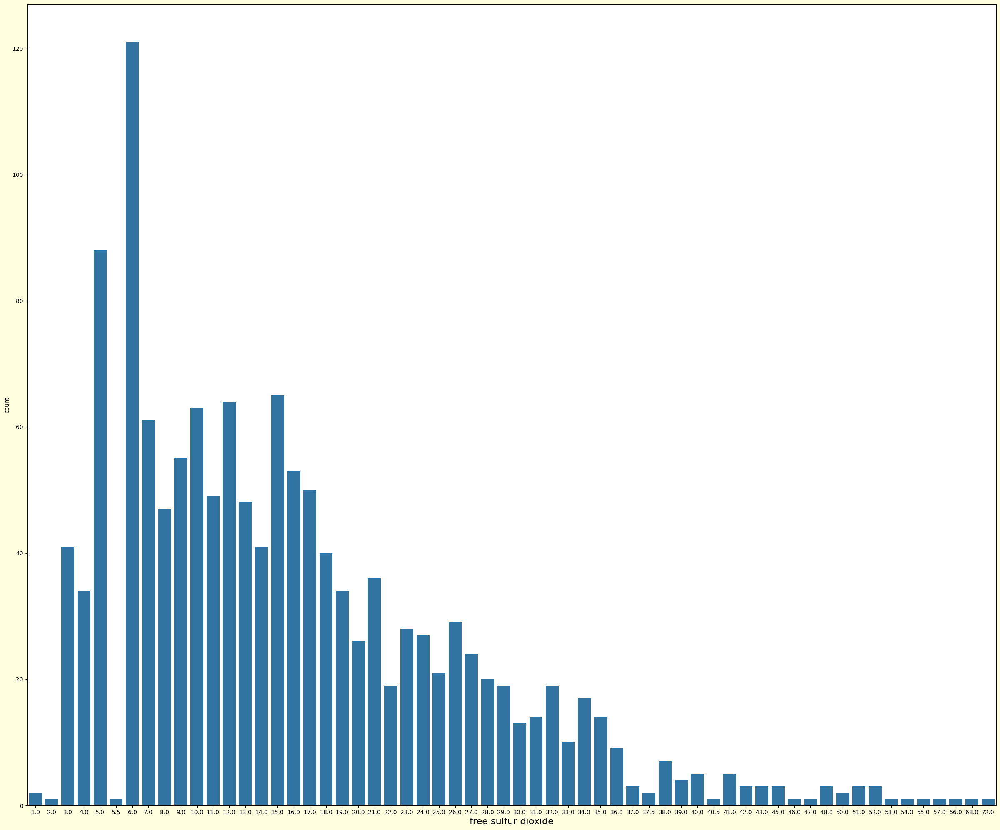

In [31]:
print(df['free sulfur dioxide'].value_counts())
plt.figure(figsize = (30,25),facecolor = 'lightyellow')
sns.countplot(x = 'free sulfur dioxide',data = df)
plt.xlabel('free sulfur dioxide',fontsize = 16)
plt.show()

chlorides
0.080    50
0.078    44
0.074    43
0.084    40
0.076    39
         ..
0.360     1
0.148     1
0.143     1
0.222     1
0.230     1
Name: count, Length: 153, dtype: int64


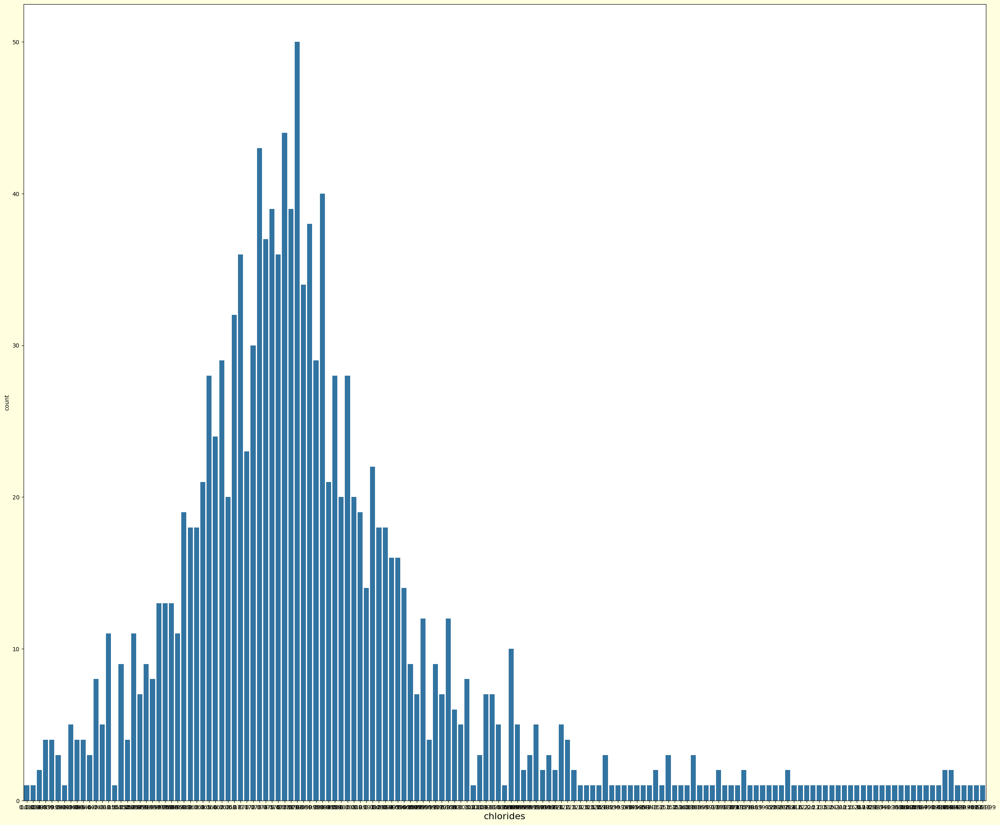

In [32]:
print(df['chlorides'].value_counts())
plt.figure(figsize = (30,25),facecolor = 'lightyellow')
sns.countplot(x = 'chlorides',data = df)
plt.xlabel('chlorides',fontsize = 16)
plt.show()

residual sugar
2.00     133
2.20     110
1.80     108
2.10     104
1.90      97
        ... 
2.25       1
2.95       1
2.85       1
3.45       1
13.90      1
Name: count, Length: 91, dtype: int64


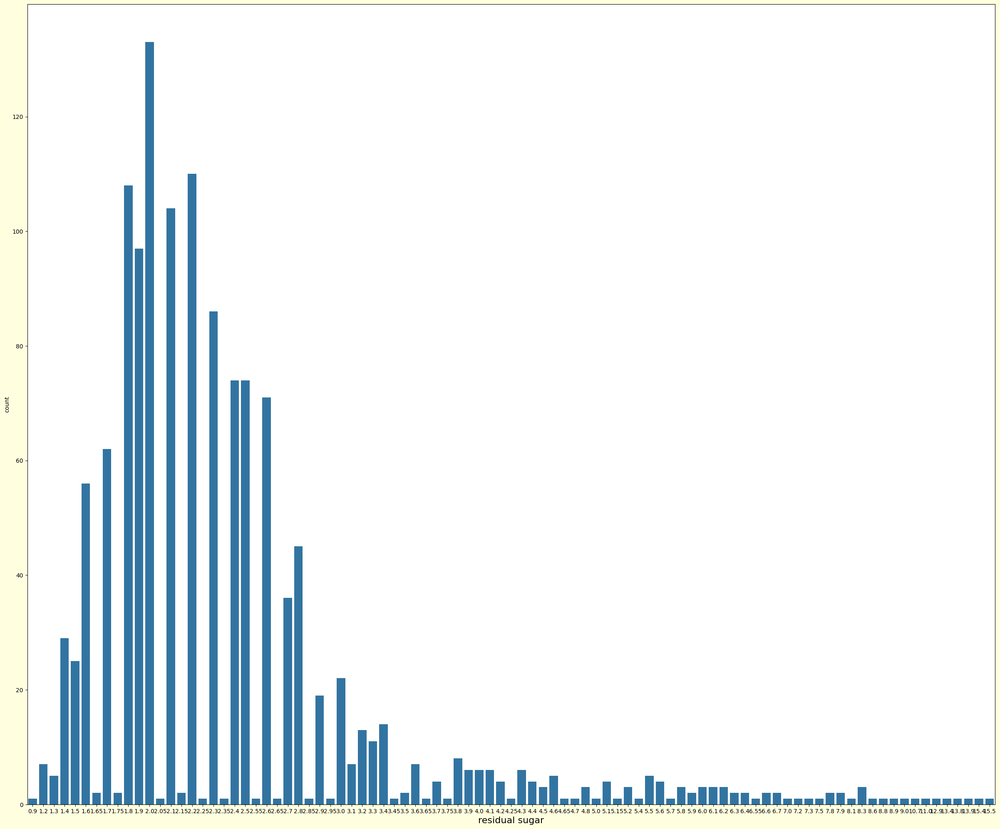

In [33]:
print(df['residual sugar'].value_counts())
plt.figure(figsize = (30,25),facecolor = 'lightyellow')
sns.countplot(x = 'residual sugar',data = df)
plt.xlabel('residual sugar',fontsize = 16)
plt.show()

citric acid
0.00    118
0.49     59
0.24     41
0.02     38
0.08     32
       ... 
0.72      1
0.62      1
0.71      1
0.79      1
0.78      1
Name: count, Length: 80, dtype: int64


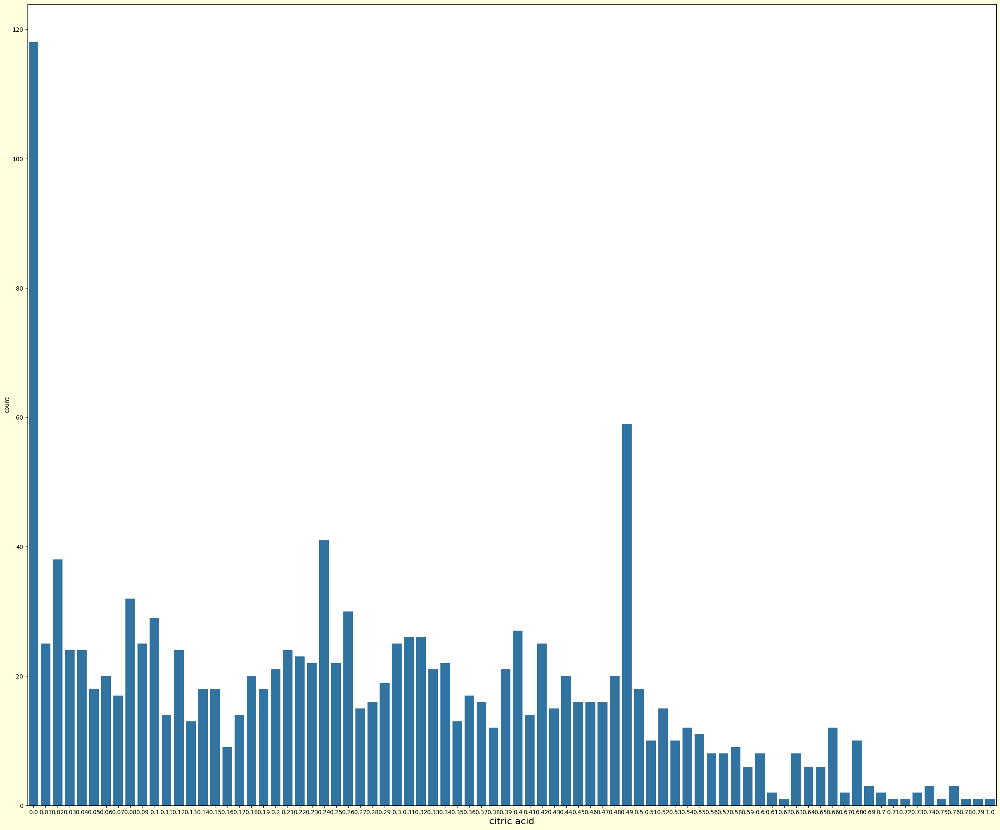

In [34]:
print(df['citric acid'].value_counts())
plt.figure(figsize = (30,25),facecolor = 'lightyellow')
sns.countplot(x = 'citric acid',data = df)
plt.xlabel('citric acid',fontsize = 16)
plt.show()

volatile acidity
0.500    37
0.580    36
0.400    35
0.600    34
0.430    33
         ..
1.185     1
1.240     1
0.845     1
0.365     1
1.090     1
Name: count, Length: 143, dtype: int64


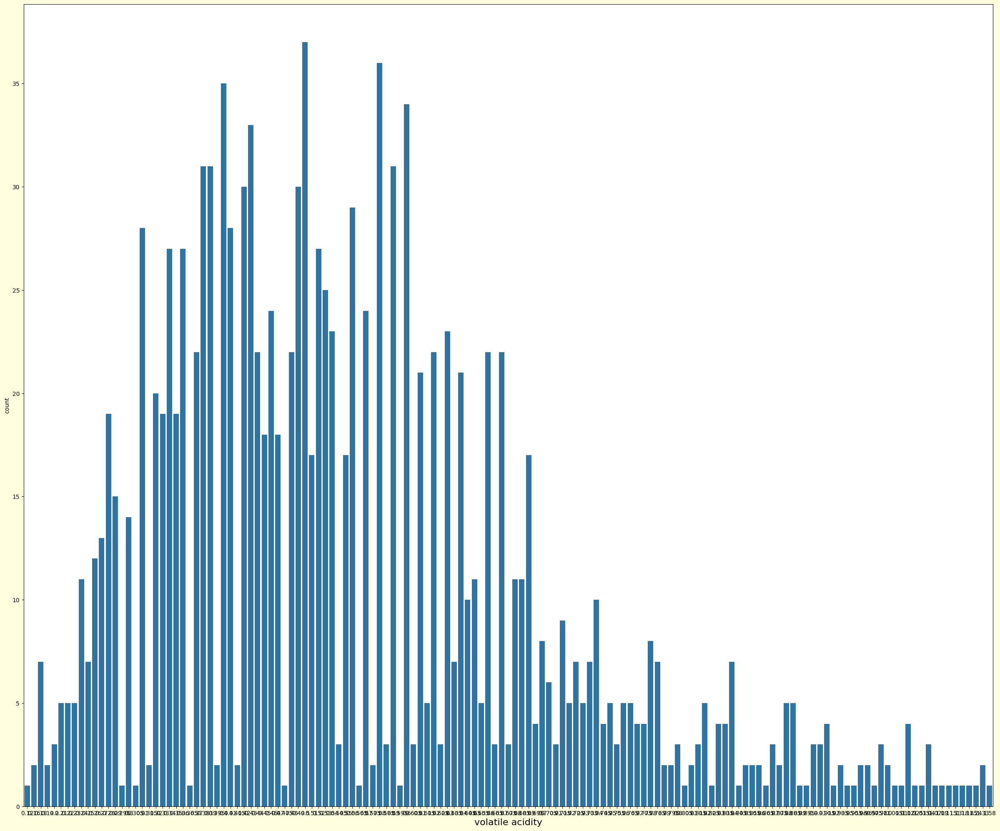

In [35]:
print(df['volatile acidity'].value_counts())
plt.figure(figsize = (30,25),facecolor = 'lightyellow')
sns.countplot(x = 'volatile acidity',data = df)
plt.xlabel('volatile acidity',fontsize = 16)
plt.show()

fixed acidity
7.2     49
7.8     48
7.1     46
7.0     44
7.5     42
        ..
13.8     1
13.4     1
4.7      1
15.0     1
5.5      1
Name: count, Length: 96, dtype: int64


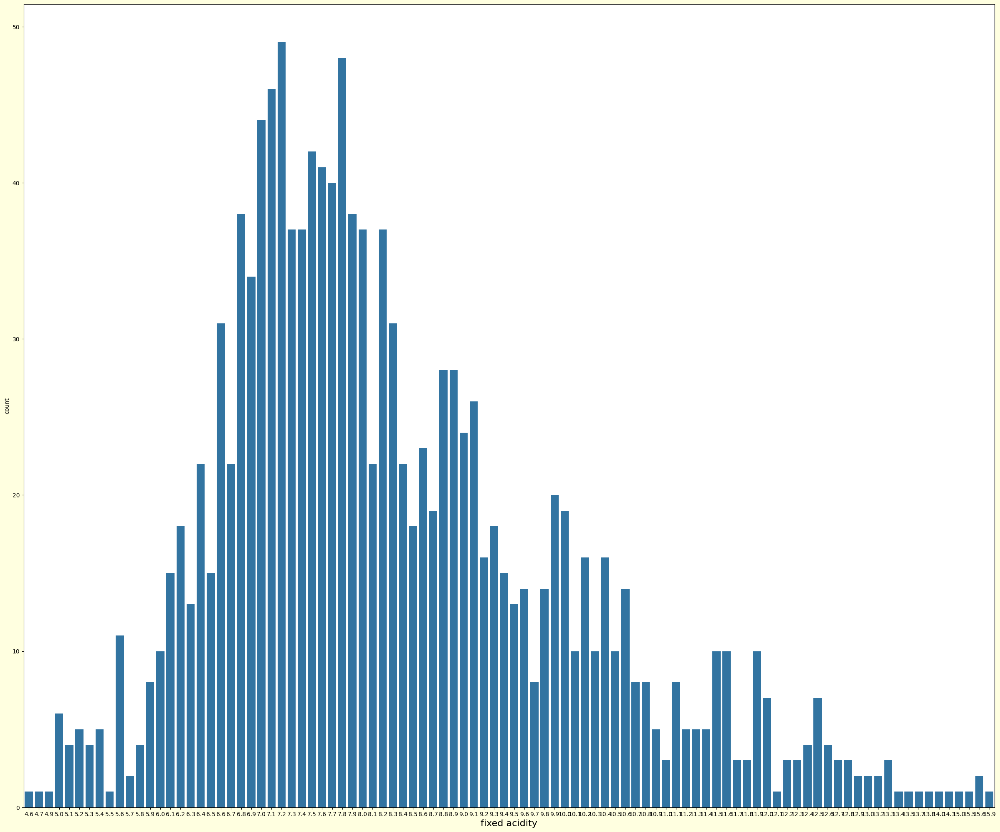

In [36]:
print(df['fixed acidity'].value_counts())
plt.figure(figsize = (30,25),facecolor = 'lightyellow')
sns.countplot(x = 'fixed acidity',data = df)
plt.xlabel('fixed acidity',fontsize = 16)
plt.show()

Bivariate Analysis

In [37]:
numerical_col

['fixed acidity',
 'volatile acidity',
 'citric acid',
 'residual sugar',
 'chlorides',
 'free sulfur dioxide',
 'total sulfur dioxide',
 'density',
 'pH',
 'sulphates',
 'alcohol',
 'quality']

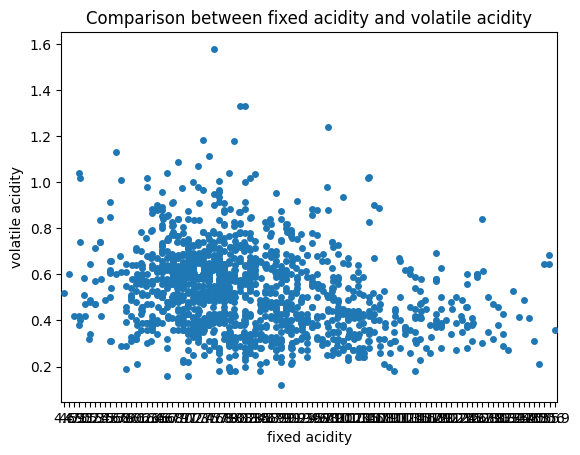

In [38]:
# Comparing fixed acidity and volatile acidity
plt.title("Comparison between fixed acidity and volatile acidity")
sns.stripplot(x = 'fixed acidity', y = 'volatile acidity',data =df)
plt.show()

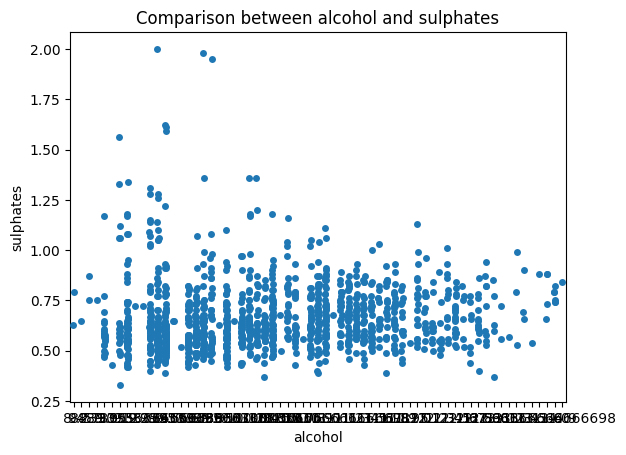

In [39]:
plt.title("Comparison between alcohol and sulphates")
sns.stripplot(x = 'alcohol', y = 'sulphates',data =df)
plt.show()

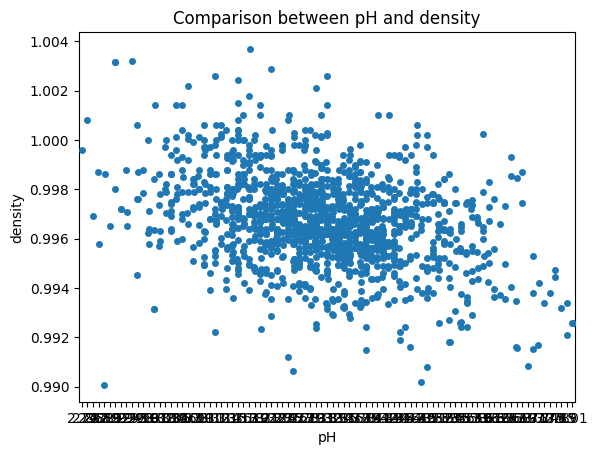

In [40]:
plt.title("Comparison between pH and density")
sns.stripplot(x = 'pH', y = 'density',data =df)
plt.show()

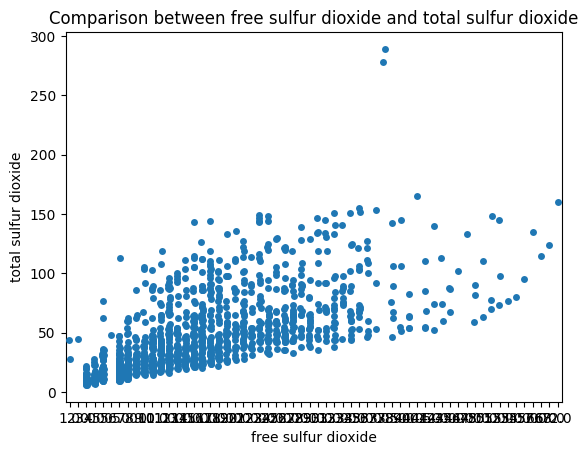

In [41]:
plt.title("Comparison between free sulfur dioxide and total sulfur dioxide")
sns.stripplot(x = 'free sulfur dioxide', y = 'total sulfur dioxide',data =df)
plt.show()

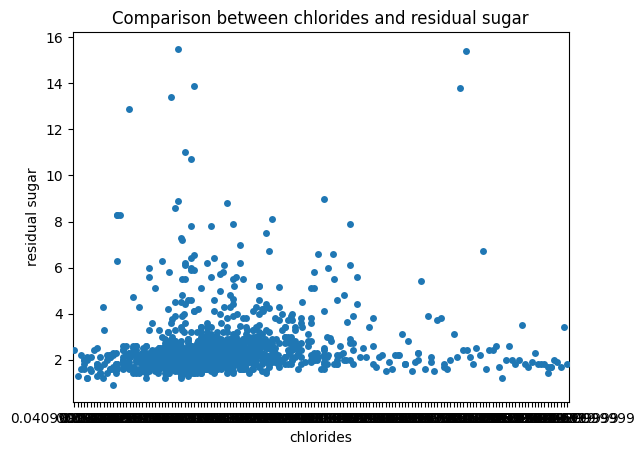

In [42]:
plt.title("Comparison between chlorides and residual sugar")
sns.stripplot(x = 'chlorides', y = 'residual sugar',data =df)
plt.show()

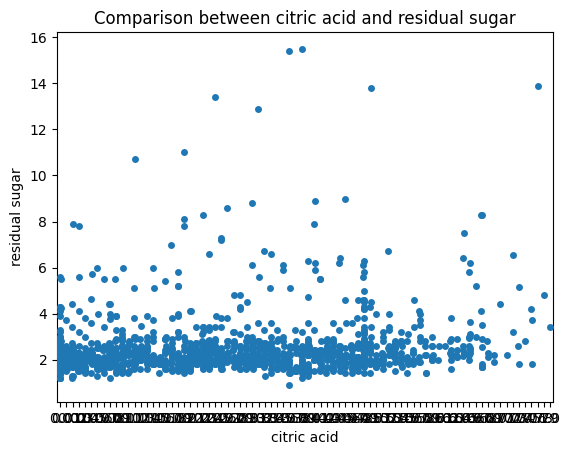

In [43]:
plt.title("Comparison between citric acid and residual sugar")
sns.stripplot(x = 'citric acid', y = 'residual sugar',data =df)
plt.show()

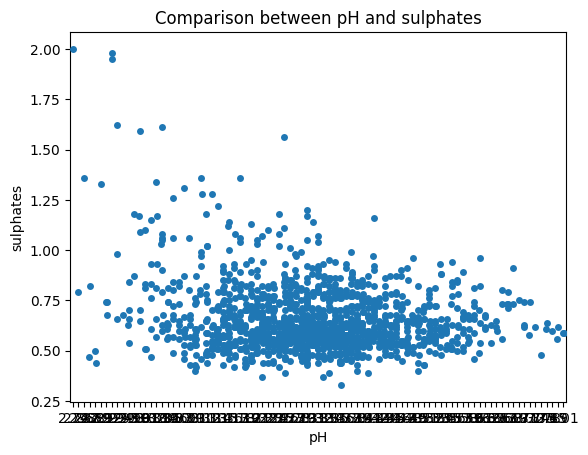

In [44]:
plt.title("Comparison between pH and sulphates")
sns.stripplot(x = 'pH', y = 'sulphates',data =df)
plt.show()

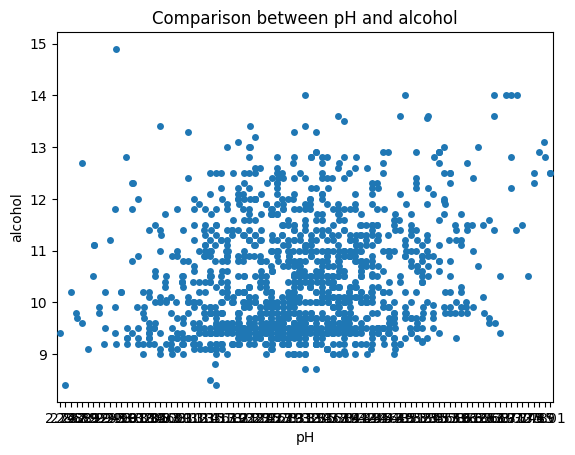

In [45]:
plt.title("Comparison between pH and alcohol")
sns.stripplot(x = 'pH', y = 'alcohol',data =df)
plt.show()

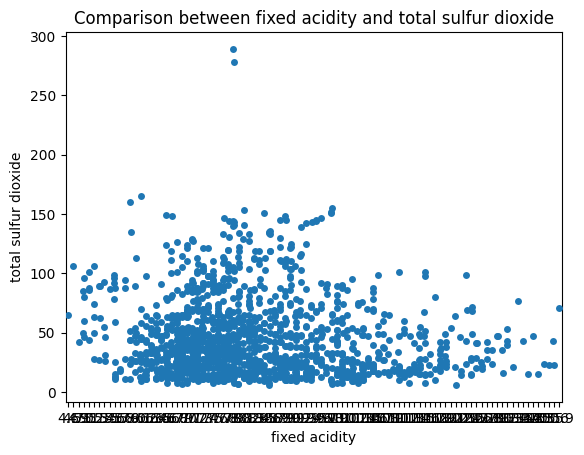

In [46]:
plt.title("Comparison between fixed acidity and total sulfur dioxide")
sns.stripplot(x = 'fixed acidity', y = 'total sulfur dioxide',data =df)
plt.show()

Multivariate Analysis

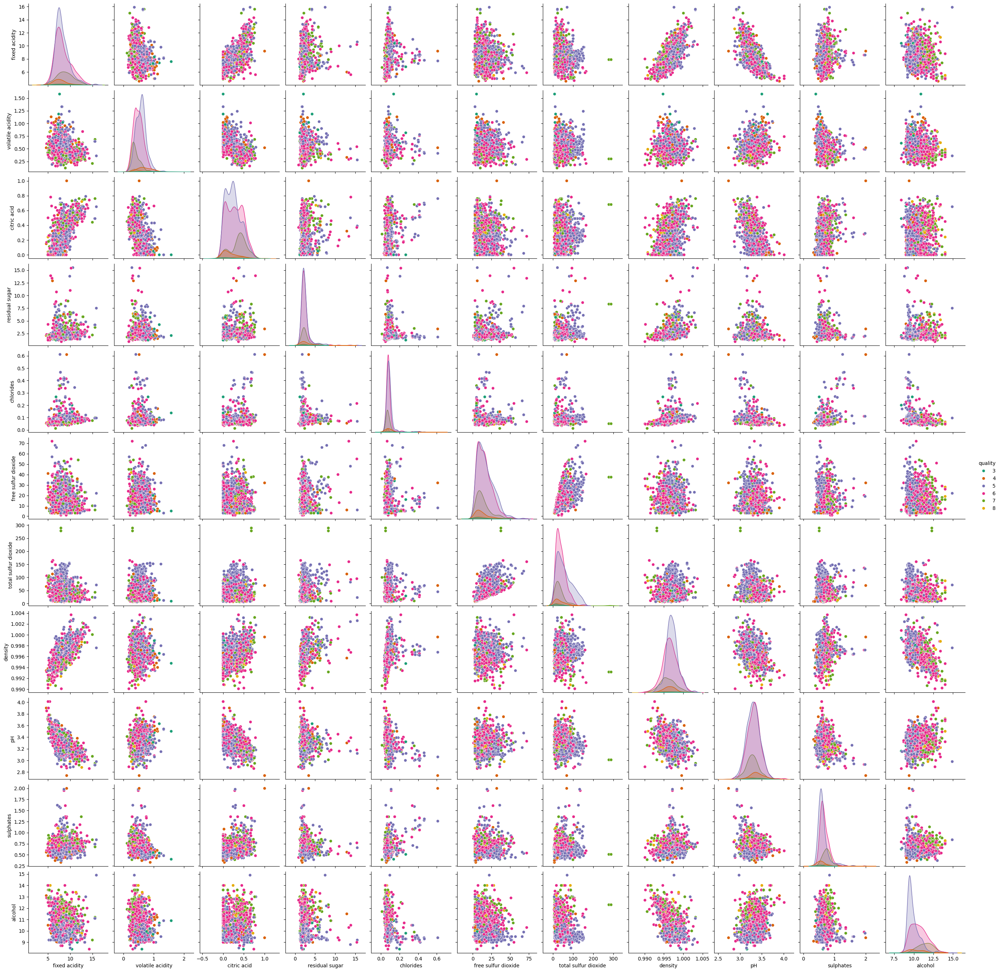

In [47]:
sns.pairplot(df,hue = 'quality',palette = 'Dark2')
plt.show()

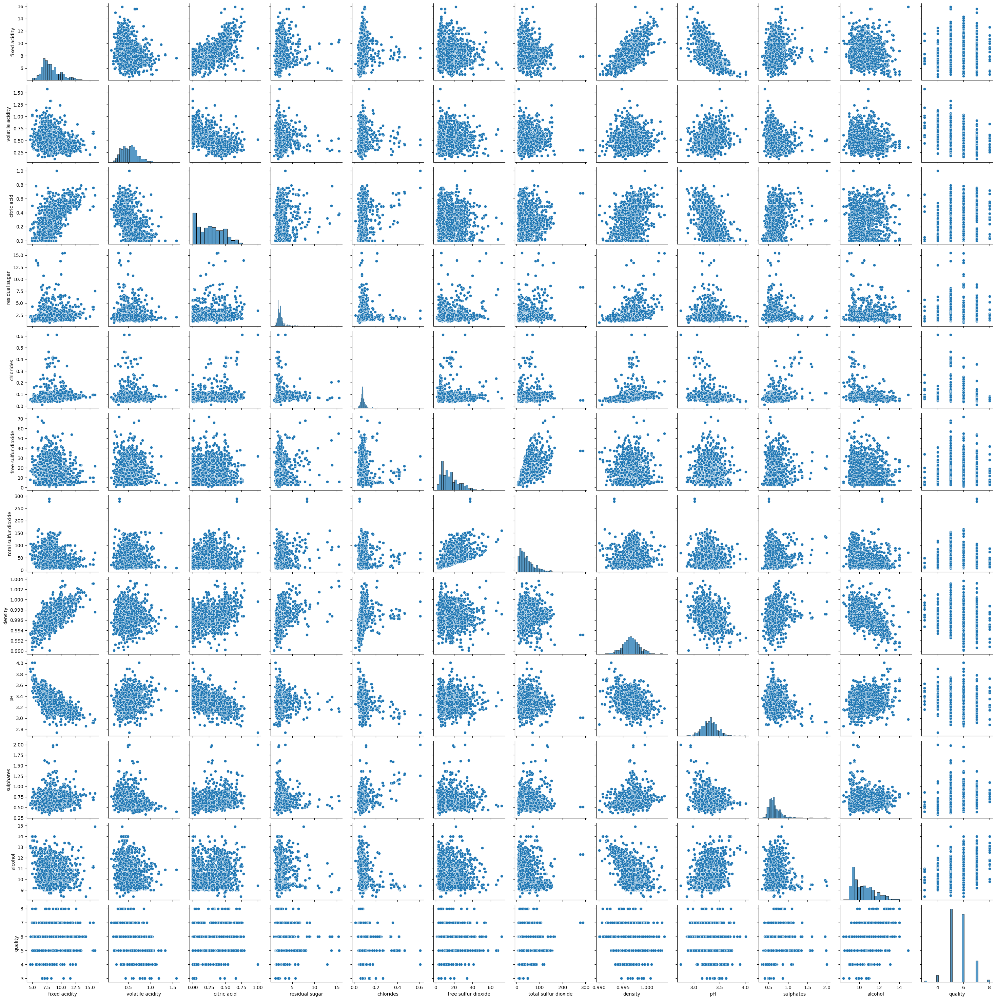

In [48]:
sns.pairplot(df,palette = 'Dark2')
plt.show()

# Treating Outliers

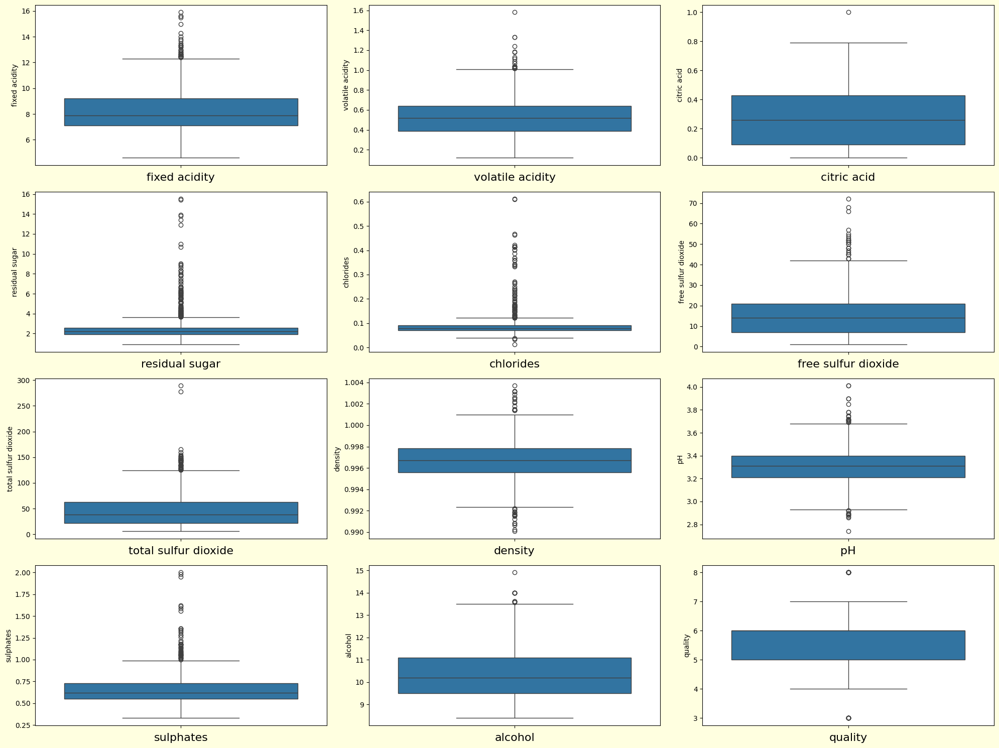

In [49]:
plt.figure(figsize = (20,15),facecolor = 'lightyellow')
plotnumber = 1

for column in df.columns:
    if plotnumber <= len(numerical_col):
        ax = plt.subplot(4,3,plotnumber)
        sns.boxplot(df[column])
        plt.xlabel(column,fontsize = 16)
    plotnumber += 1
plt.tight_layout()

Use Z-score statistics for treating outliers

In [50]:
from scipy.stats import zscore

z_score = zscore(df[['alcohol','sulphates','pH','density','total sulfur dioxide','free sulfur dioxide','chlorides','residual sugar',
                    'fixed acidity','volatile acidity']])
abs_z_score = np.abs(z_score)
filtering_entry = (abs_z_score < 3).all(axis = 1)
df = df[filtering_entry]
df.sample(n = 10)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
351,9.1,0.795,0.00,2.6,0.096,11.0,26.0,0.99940,3.35,0.83,9.4,6
1044,6.4,0.390,0.33,3.3,0.046,12.0,53.0,0.99294,3.36,0.62,12.2,6
816,9.8,0.510,0.19,3.2,0.081,8.0,30.0,0.99840,3.23,0.58,10.5,6
622,10.0,0.580,0.22,1.9,0.080,9.0,32.0,0.99740,3.13,0.55,9.5,5
155,7.1,0.430,0.42,5.5,0.071,28.0,128.0,0.99730,3.42,0.71,10.5,5
1138,7.5,0.410,0.15,3.7,0.104,29.0,94.0,0.99786,3.14,0.58,9.1,5
165,7.8,0.630,0.48,1.7,0.100,14.0,96.0,0.99610,3.19,0.62,9.5,5
454,7.0,0.230,0.40,1.6,0.063,21.0,67.0,0.99520,3.50,0.63,11.1,5
901,7.4,0.635,0.10,2.4,0.080,16.0,33.0,0.99736,3.58,0.69,10.8,7
417,7.0,0.580,0.12,1.9,0.091,34.0,124.0,0.99560,3.44,0.48,10.5,5


In [51]:
df.shape

(1239, 12)

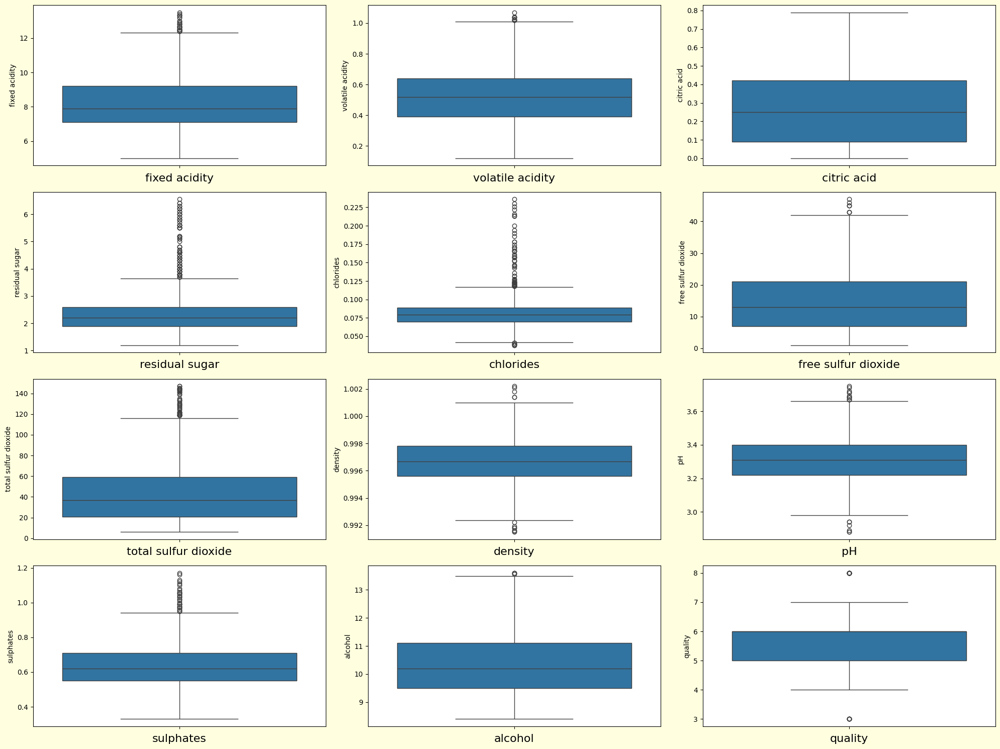

In [52]:
plt.figure(figsize = (20,15),facecolor = 'lightyellow')
plotnumber = 1

for column in df.columns:
    if plotnumber <= len(numerical_col):
        ax = plt.subplot(4,3,plotnumber)
        sns.boxplot(df[column])
        plt.xlabel(column,fontsize = 16)
    plotnumber += 1
plt.tight_layout()

In [53]:
df.skew()

fixed acidity           0.803687
volatile acidity        0.443794
citric acid             0.277957
residual sugar          2.371572
chlorides               2.480193
free sulfur dioxide     0.867795
total sulfur dioxide    1.165286
density                 0.018132
pH                      0.116731
sulphates               0.952455
alcohol                 0.765872
quality                 0.229533
dtype: float64

# Correlation between target variable and independent variables

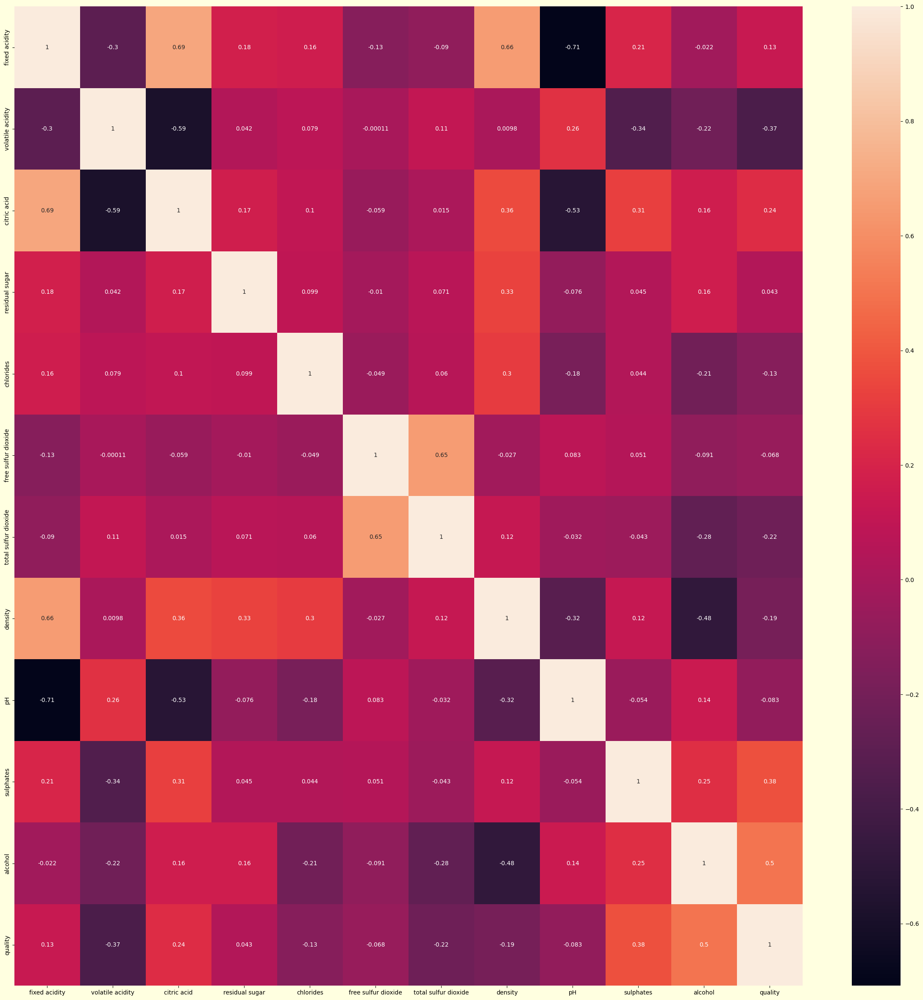

In [54]:
corr = df.corr()
plt.figure(figsize = (30,30),facecolor = 'lightyellow')
sns.heatmap(corr,annot = True)
plt.show()

In [55]:
corr

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,-0.295214,0.694900,0.178596,0.161180,-0.129192,-0.090289,0.659316,-0.708471,0.206067,-0.021713,0.131621
volatile acidity,-0.295214,1.000000,-0.586277,0.042038,0.079047,-0.000112,0.107727,0.009798,0.263937,-0.341434,-0.216562,-0.369907
citric acid,0.694900,-0.586277,1.000000,0.167597,0.099672,-0.058634,0.015058,0.359234,-0.527456,0.314609,0.161903,0.239204
residual sugar,0.178596,0.042038,0.167597,1.000000,0.098867,-0.010233,0.070850,0.329232,-0.076026,0.044924,0.161289,0.043436
chlorides,0.161180,0.079047,0.099672,0.098867,1.000000,-0.049311,0.059787,0.303134,-0.181430,0.044450,-0.211516,-0.131943
free sulfur dioxide,-0.129192,-0.000112,-0.058634,-0.010233,-0.049311,1.000000,0.654391,-0.027018,0.083310,0.051044,-0.090889,-0.067511
total sulfur dioxide,-0.090289,0.107727,0.015058,0.070850,0.059787,0.654391,1.000000,0.122758,-0.031596,-0.042984,-0.278700,-0.222127
density,0.659316,0.009798,0.359234,0.329232,0.303134,-0.027018,0.122758,1.000000,-0.321350,0.119810,-0.484351,-0.190830
pH,-0.708471,0.263937,-0.527456,-0.076026,-0.181430,0.083310,-0.031596,-0.321350,1.000000,-0.054193,0.140959,-0.082619
sulphates,0.206067,-0.341434,0.314609,0.044924,0.044450,0.051044,-0.042984,0.119810,-0.054193,1.000000,0.248136,0.378255


<function matplotlib.pyplot.show(close=None, block=None)>

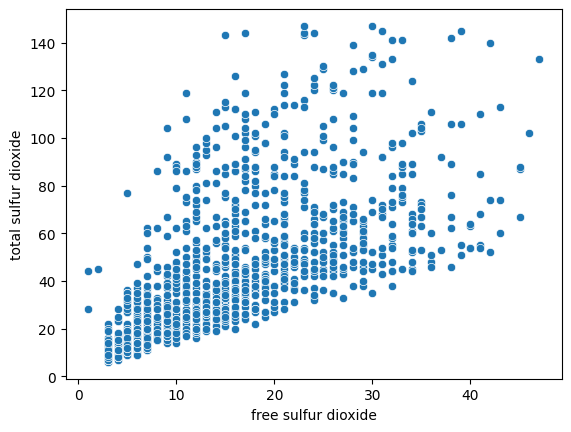

In [56]:
sns.scatterplot(x = 'free sulfur dioxide', y = 'total sulfur dioxide',data = df)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

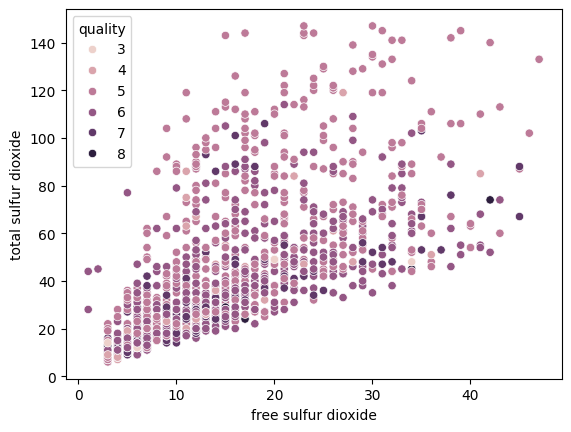

In [57]:
sns.scatterplot(x = 'free sulfur dioxide', y = 'total sulfur dioxide',data = df,hue = 'quality')
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

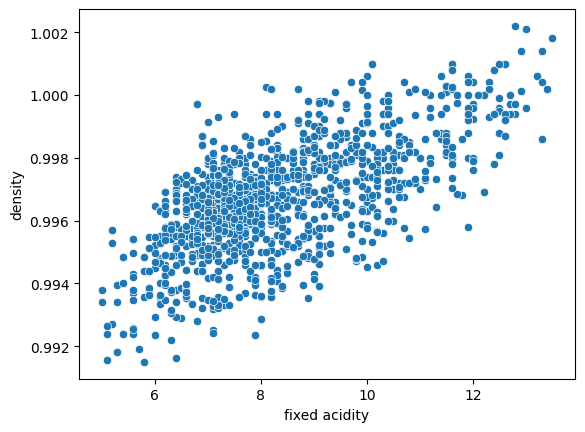

In [58]:
sns.scatterplot(x = 'fixed acidity', y = 'density',data = df)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

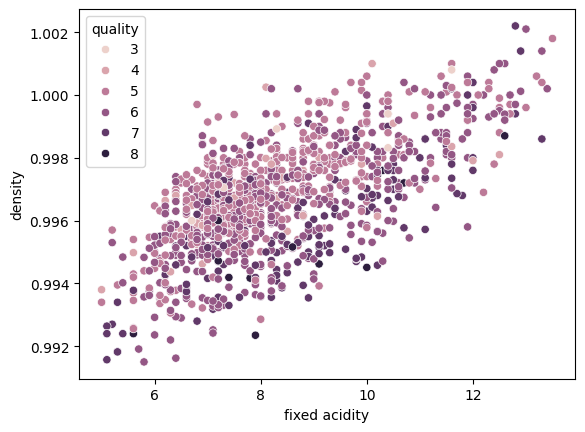

In [59]:
sns.scatterplot(x = 'fixed acidity', y = 'density',data = df,hue = 'quality')
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

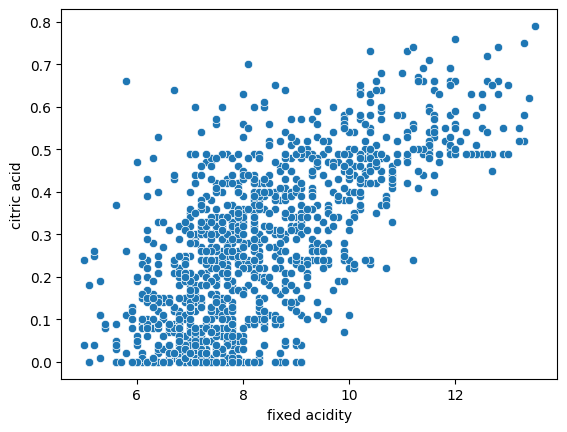

In [60]:
sns.scatterplot(x = 'fixed acidity', y = 'citric acid',data = df)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

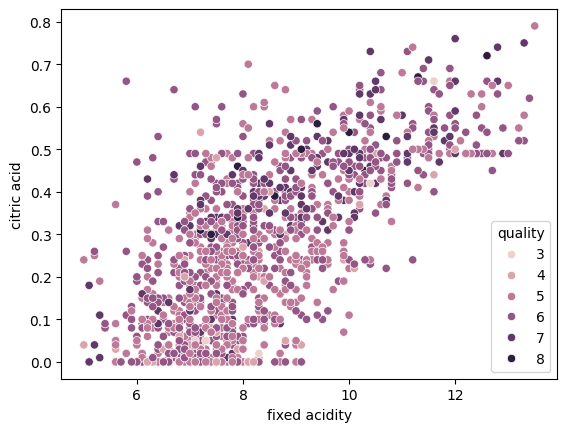

In [61]:
sns.scatterplot(x = 'fixed acidity', y = 'citric acid',data = df,hue = 'quality')
plt.show

In [62]:
from sklearn.feature_selection import SelectKBest,f_classif

In [63]:
X = df.drop('quality',axis = 1)
y = df.quality
best_features = SelectKBest(score_func = f_classif, k = 11)
fit = best_features.fit(X,y)
df_scores = pd.DataFrame(fit.scores_)
df_columns = pd.DataFrame(X.columns)

feature_scores = pd.concat([df_scores,df_columns],axis = 1)
feature_scores.columns = ['Score','Feature']
print(feature_scores.nlargest(11,'Score'))

         Score               Feature
10  100.253335               alcohol
9    44.684390             sulphates
1    40.640170      volatile acidity
6    27.172842  total sulfur dioxide
2    16.673251           citric acid
7    11.467914               density
4     6.108779             chlorides
0     5.445794         fixed acidity
5     4.245351   free sulfur dioxide
8     4.070478                    pH
3     3.345683        residual sugar


# Feature Scaling and Standardization

In [64]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Checking Variance Inflation Factor

In [65]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X_scaled,i) for i in range(X_scaled.shape[1])]
vif['Features'] = X.columns

vif

,VIF values,Features
0,7.960712,fixed acidity
1,1.855225,volatile acidity
2,3.155072,citric acid
3,1.618890,residual sugar
4,1.163867,chlorides
5,1.904153,free sulfur dioxide
6,2.181479,total sulfur dioxide
7,6.391211,density
8,3.228857,pH
9,1.323185,sulphates


# Modelling

Finding the best random state

In [66]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
maxAcc = 0
maxRS = 0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(X_scaled,y,test_size = 0.30,random_state = i)
    RFR = RandomForestClassifier()
    RFR.fit(x_train,y_train)
    pred = RFR.predict(x_test)
    acc = accuracy_score(y_test,pred)
    if acc > maxAcc:
        maxAcc = acc
        maxRS = i
print("Best Accuracy is " + str(maxAcc) + "at random state " + str(maxRS))

Best Accuracy is 0.6559139784946236at random state 140


Creating Train Test Split

In [67]:
x_train,x_test,y_train,y_test = train_test_split(X_scaled,y,test_size = 0.30,random_state = 140)

Classification Algorithms

In [68]:
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier,AdaBoostClassifier,BaggingClassifier
from sklearn.metrics import accuracy_score,classification_report,roc_curve,confusion_matrix
from sklearn.model_selection import cross_val_score

In [69]:
from sklearn.neighbors import KNeighborsClassifier

In [70]:
from sklearn.metrics import auc

In [71]:
# Train models
rfc = RandomForestClassifier()
etc = ExtraTreesClassifier()
dtc = DecisionTreeClassifier()
svc = SVC()
gbc = GradientBoostingClassifier()
abc = AdaBoostClassifier()
knc = KNeighborsClassifier()

models = {
    'Random Forest':rfc,
    'Extra Trees':etc,
    'Decision Tree': dtc,
    'SVM': svc,
    'Gradient Boosting':gbc,
    'Ada boost': abc,
    'KNN':knc
}

In [72]:
rfc.fit(x_train,y_train)
pred_rfc = rfc.predict(x_test)
print(accuracy_score(y_test,pred_rfc))
print(confusion_matrix(y_test,pred_rfc))
print(classification_report(y_test,pred_rfc))

0.6344086021505376
[[  0   0   0   0   0   0]
 [  1   0   9   4   0   0]
 [  0   0 122  34   1   0]
 [  0   0  46  95  10   0]
 [  0   0   5  19  19   0]
 [  0   0   0   5   2   0]]
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         0
           4       0.00      0.00      0.00        14
           5       0.67      0.78      0.72       157
           6       0.61      0.63      0.62       151
           7       0.59      0.44      0.51        43
           8       0.00      0.00      0.00         7

    accuracy                           0.63       372
   macro avg       0.31      0.31      0.31       372
weighted avg       0.60      0.63      0.61       372



In [73]:
etc.fit(x_train,y_train)
pred_etc = etc.predict(x_test)
print(accuracy_score(y_test,pred_etc))
print(confusion_matrix(y_test,pred_etc))
print(classification_report(y_test,pred_etc))

0.6155913978494624
[[  0   0   0   0   0   0]
 [  1   0  10   3   0   0]
 [  0   0 121  35   1   0]
 [  0   0  49  92  10   0]
 [  0   0   3  24  16   0]
 [  0   0   0   5   2   0]]
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         0
           4       0.00      0.00      0.00        14
           5       0.66      0.77      0.71       157
           6       0.58      0.61      0.59       151
           7       0.55      0.37      0.44        43
           8       0.00      0.00      0.00         7

    accuracy                           0.62       372
   macro avg       0.30      0.29      0.29       372
weighted avg       0.58      0.62      0.59       372



In [74]:
dtc.fit(x_train,y_train)
pred_dtc = dtc.predict(x_test)
print(accuracy_score(y_test,pred_dtc))
print(confusion_matrix(y_test,pred_dtc))
print(classification_report(y_test,pred_dtc))

0.49731182795698925
[[ 0  0  0  0  0  0]
 [ 1  1 10  1  1  0]
 [ 1  6 97 46  6  1]
 [ 0  1 56 72 22  0]
 [ 0  0  3 21 15  4]
 [ 0  0  1  2  4  0]]
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         0
           4       0.12      0.07      0.09        14
           5       0.58      0.62      0.60       157
           6       0.51      0.48      0.49       151
           7       0.31      0.35      0.33        43
           8       0.00      0.00      0.00         7

    accuracy                           0.50       372
   macro avg       0.25      0.25      0.25       372
weighted avg       0.49      0.50      0.49       372



In [75]:
svc.fit(x_train,y_train)
pred_svc = svc.predict(x_test)
print(accuracy_score(y_test,pred_svc))
print(confusion_matrix(y_test,pred_svc))
print(classification_report(y_test,pred_svc))

0.6424731182795699
[[  0  10   4   0   0]
 [  0 125  31   1   0]
 [  0  49  96   6   0]
 [  0   4  21  18   0]
 [  0   0   4   3   0]]
              precision    recall  f1-score   support

           4       0.00      0.00      0.00        14
           5       0.66      0.80      0.72       157
           6       0.62      0.64      0.63       151
           7       0.64      0.42      0.51        43
           8       0.00      0.00      0.00         7

    accuracy                           0.64       372
   macro avg       0.38      0.37      0.37       372
weighted avg       0.60      0.64      0.62       372



In [76]:
gbc.fit(x_train,y_train)
pred_gbc = gbc.predict(x_test)
print(accuracy_score(y_test,pred_gbc))
print(confusion_matrix(y_test,pred_gbc))
print(classification_report(y_test,pred_gbc))

0.6102150537634409
[[  0   0   0   0   0   0]
 [  1   0   9   4   0   0]
 [  1   3 112  38   2   1]
 [  0   1  42  94  13   1]
 [  0   0   3  19  21   0]
 [  0   0   0   3   4   0]]
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         0
           4       0.00      0.00      0.00        14
           5       0.67      0.71      0.69       157
           6       0.59      0.62      0.61       151
           7       0.53      0.49      0.51        43
           8       0.00      0.00      0.00         7

    accuracy                           0.61       372
   macro avg       0.30      0.30      0.30       372
weighted avg       0.59      0.61      0.60       372



In [77]:
abc.fit(x_train,y_train)
pred_abc = abc.predict(x_test)
print(accuracy_score(y_test,pred_abc))
print(confusion_matrix(y_test,pred_abc))
print(classification_report(y_test,pred_abc))

0.5188172043010753
[[  0   0   0   0   0   0]
 [  1   0   7   6   0   0]
 [ 17   0 119  21   0   0]
 [  1   0  76  74   0   0]
 [  0   0   8  35   0   0]
 [  0   0   2   5   0   0]]
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         0
           4       0.00      0.00      0.00        14
           5       0.56      0.76      0.64       157
           6       0.52      0.49      0.51       151
           7       0.00      0.00      0.00        43
           8       0.00      0.00      0.00         7

    accuracy                           0.52       372
   macro avg       0.18      0.21      0.19       372
weighted avg       0.45      0.52      0.48       372



In [78]:
knc.fit(x_train,y_train)
pred_knc = knc.predict(x_test)
print(accuracy_score(y_test,pred_knc))
print(confusion_matrix(y_test,pred_knc))
print(classification_report(y_test,pred_knc))

0.5698924731182796
[[  0  10   4   0   0]
 [  3 110  41   3   0]
 [  3  54  85   9   0]
 [  0   5  21  17   0]
 [  0   1   3   3   0]]
              precision    recall  f1-score   support

           4       0.00      0.00      0.00        14
           5       0.61      0.70      0.65       157
           6       0.55      0.56      0.56       151
           7       0.53      0.40      0.45        43
           8       0.00      0.00      0.00         7

    accuracy                           0.57       372
   macro avg       0.34      0.33      0.33       372
weighted avg       0.54      0.57      0.55       372



Cross Validation Score

In [79]:
from sklearn.model_selection import cross_val_score

In [80]:
# Check cv scores for Random Forest
score = cross_val_score(rfc,X_scaled,y)
print(score)
print(score.mean())
print("Difference between accuracy score and cross val score is :" , accuracy_score(y_test,pred_rfc) - score.mean())

[0.52016129 0.57258065 0.62096774 0.59274194 0.60323887]
0.5819380958599975
Difference between accuracy score and cross val score is : 0.052470506290540175


In [81]:
# Check cv scores for Extra Trees
score = cross_val_score(etc,X_scaled,y)
print(score)
print(score.mean())
print("Difference between accuracy score and cross val score is :" , accuracy_score(y_test,pred_etc) - score.mean())

[0.52016129 0.54032258 0.61693548 0.57258065 0.57489879]
0.5649797570850202
Difference between accuracy score and cross val score is : 0.050611640764442134


In [82]:
# Check cv scores for Decision Trees
score = cross_val_score(dtc,X_scaled,y)
print(score)
print(score.mean())
print("Difference between accuracy score and cross val score is :" , accuracy_score(y_test,pred_dtc) - score.mean())

[0.45967742 0.46370968 0.49193548 0.41532258 0.48178138]
0.46248530756170825
Difference between accuracy score and cross val score is : 0.034826520395281


In [83]:
# Check cv scores for SVM
score = cross_val_score(svc,X_scaled,y)
print(score)
print(score.mean())
print("Difference between accuracy score and cross val score is :" , accuracy_score(y_test,pred_svc) - score.mean())

[0.52822581 0.52419355 0.63306452 0.60483871 0.59109312]
0.5762831396108136
Difference between accuracy score and cross val score is : 0.06618997866875631


In [84]:
# Check cv scores for Gradient Boostin
score = cross_val_score(gbc,X_scaled,y)
print(score)
print(score.mean())
print("Difference between accuracy score and cross val score is :" , accuracy_score(y_test,pred_gbc) - score.mean())

[0.53629032 0.54032258 0.58064516 0.58064516 0.54251012]
0.5560826694527883
Difference between accuracy score and cross val score is : 0.05413238431065259


In [85]:
# Check cv scores for Adaboost
score = cross_val_score(abc,X_scaled,y)
print(score)
print(score.mean())
print("Difference between accuracy score and cross val score is :" , accuracy_score(y_test,pred_abc) - score.mean())

[0.47983871 0.36693548 0.61693548 0.53225806 0.53846154]
0.5068858560794045
Difference between accuracy score and cross val score is : 0.011931348221670746


In [86]:
# Check cv scores for knn
score = cross_val_score(knc,X_scaled,y)
print(score)
print(score.mean())
print("Difference between accuracy score and cross val score is :" , accuracy_score(y_test,pred_knc) - score.mean())

[0.50403226 0.5483871  0.59274194 0.52822581 0.50607287]
0.5358919942536241
Difference between accuracy score and cross val score is : 0.034000478864655514


For best model the difference between accuracy score and cross val score should be least

# Hyper Parameter Tuning

In [87]:
# AdaBoostClassifier
from sklearn.model_selection import GridSearchCV

help(GridSearchCV)

Help on class GridSearchCV in module sklearn.model_selection._search:

class GridSearchCV(BaseSearchCV)
 |  GridSearchCV(estimator, param_grid, *, scoring=None, n_jobs=None, refit=True, cv=None, verbose=0, pre_dispatch='2*n_jobs', error_score=nan, return_train_score=False)
 |  
 |  Exhaustive search over specified parameter values for an estimator.
 |  
 |  Important members are fit, predict.
 |  
 |  GridSearchCV implements a "fit" and a "score" method.
 |  It also implements "score_samples", "predict", "predict_proba",
 |  "decision_function", "transform" and "inverse_transform" if they are
 |  implemented in the estimator used.
 |  
 |  The parameters of the estimator used to apply these methods are optimized
 |  by cross-validated grid-search over a parameter grid.
 |  
 |  Read more in the :ref:`User Guide <grid_search>`.
 |  
 |  Parameters
 |  ----------
 |  estimator : estimator object
 |      This is assumed to implement the scikit-learn estimator interface.
 |      Either est

In [89]:
param_grid = {
    'n_estimators':range(1,38),
    'learning_rate':[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
}

In [90]:
grid_search = GridSearchCV(AdaBoostClassifier(),param_grid= param_grid,cv =5)
grid_search.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=AdaBoostClassifier(),
             param_grid={'learning_rate': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7,
                                           0.8, 0.9],
                         'n_estimators': range(1, 38)})

In [91]:
grid_search.best_estimator_

AdaBoostClassifier(learning_rate=0.1, n_estimators=10)

In [92]:
grid_search.best_params_

{'learning_rate': 0.1, 'n_estimators': 10}

In [93]:
grid_search.best_score_

0.5490399309016012

In [94]:
final_model = grid_search.best_estimator_
pred = final_model.predict(x_test)
acc = accuracy_score(y_test,pred)
print(acc * 100)

57.795698924731184


Saving the model using .pkl

In [98]:
import joblib
joblib.dump(final_model,'Red Wine Quality Prediction Project.pkl')

['Red Wine Quality Prediction Project.pkl']

In [99]:
# Let's load the saved model and get the predictions
model = joblib.load('Red Wine Quality Prediction Project.pkl')

# Prediction
prediction = model.predict(x_test)
prediction

array([6, 5, 6, 5, 5, 5, 6, 5, 5, 6, 6, 6, 5, 6, 6, 5, 5, 5, 5, 6, 5, 6,
       6, 6, 6, 6, 6, 5, 6, 6, 6, 5, 5, 6, 5, 5, 5, 6, 6, 5, 6, 5, 6, 6,
       6, 6, 5, 6, 5, 5, 6, 5, 5, 5, 6, 6, 6, 5, 5, 6, 5, 6, 5, 6, 5, 6,
       6, 6, 6, 5, 6, 5, 6, 6, 6, 5, 6, 5, 6, 5, 5, 6, 5, 5, 5, 6, 5, 5,
       6, 6, 5, 6, 6, 5, 6, 6, 6, 6, 5, 5, 5, 6, 5, 5, 5, 6, 6, 5, 6, 6,
       6, 6, 6, 5, 6, 6, 5, 5, 6, 5, 6, 6, 5, 6, 6, 5, 6, 6, 5, 6, 6, 6,
       5, 6, 5, 6, 6, 6, 6, 6, 5, 5, 6, 6, 5, 5, 6, 6, 6, 5, 6, 5, 6, 6,
       6, 5, 6, 6, 6, 5, 6, 6, 6, 6, 5, 6, 5, 6, 5, 6, 6, 6, 6, 6, 6, 6,
       6, 6, 5, 5, 5, 6, 6, 6, 5, 6, 6, 6, 5, 6, 6, 5, 6, 6, 6, 5, 6, 5,
       6, 5, 6, 6, 5, 6, 6, 6, 6, 6, 5, 5, 6, 6, 5, 6, 6, 5, 6, 6, 5, 6,
       6, 5, 6, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 5, 6, 5, 5, 5, 6, 5, 5, 5,
       6, 5, 6, 5, 5, 5, 5, 6, 6, 6, 6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 5, 6,
       6, 5, 5, 6, 6, 6, 6, 5, 6, 6, 6, 6, 6, 6, 6, 5, 5, 6, 5, 6, 6, 6,
       6, 5, 6, 6, 6, 6, 6, 6, 5, 6, 5, 6, 6, 6, 6,